In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import torch
from chronos import BaseChronosPipeline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

df = pd.read_csv('./weather.csv')


c:\Users\navid-pc\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


C:\Users\navid-pc\AppData\Local\Temp\ipykernel_24936\235159082.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


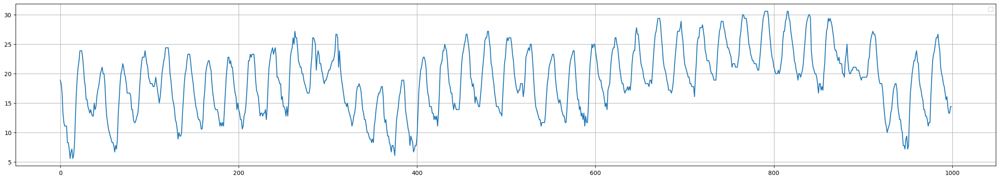

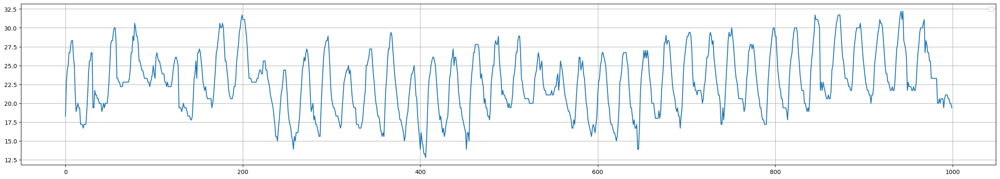

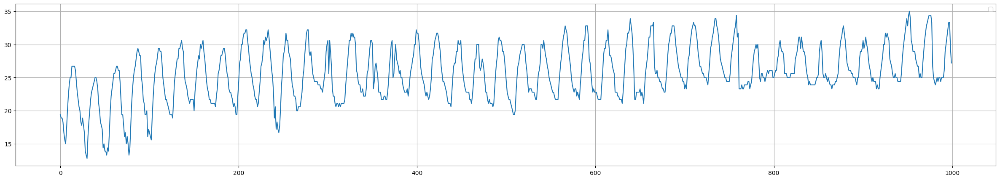

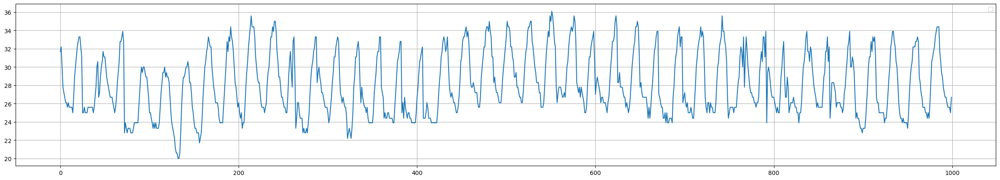

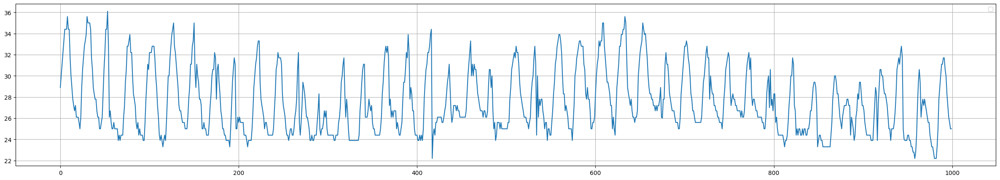

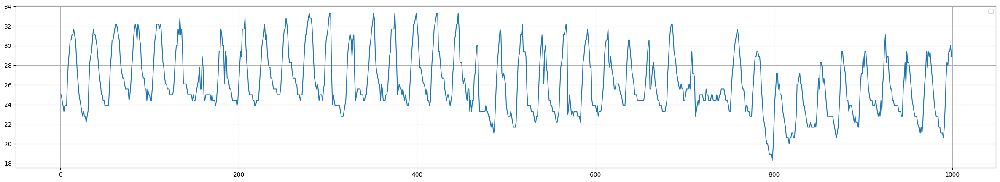

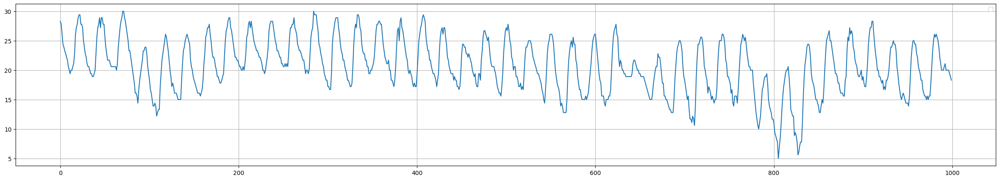

In [ ]:
data =  df['airTemperature'].values

for i in range(1000, 8000, 1000):
    plt.figure(figsize=(30, 5))
    plt.plot(data[i:i+1000])
    plt.legend()
    plt.grid()
    plt.show()
    data_chunk = data[i:i+1000]


# Chronos model

In [10]:
pipeline = BaseChronosPipeline.from_pretrained(
    "amazon/chronos-t5-small",
    device_map="cuda",  
    torch_dtype=torch.bfloat16,
)

We recommend keeping prediction length <= 64. The quality of longer predictions may degrade since the model is not optimized for it. 


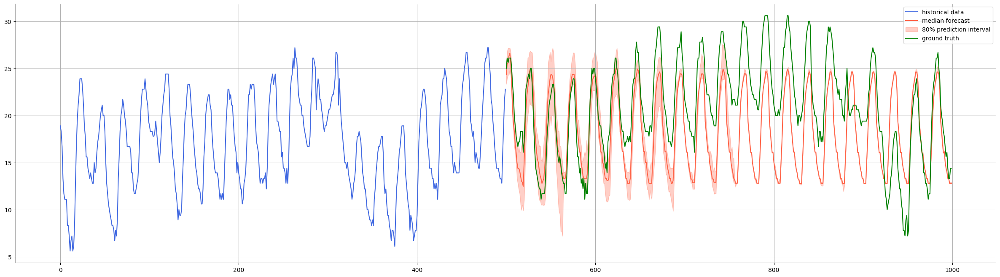

In [11]:
# this code applies choronos pipeline to the data wihtout looking at the future data. 
# This is just to show how chronos will gradually deviate from the data. In this project 
# I only predict one point at a tiem and use the ground truth for next step rather than 
# doing it autoregressively for the entire forecast window

quantiles, mean = pipeline.predict_quantiles(
    context=torch.tensor(data[100:1500]),
    prediction_length=500,
    quantile_levels=[0.1, 0.5, 0.9],
)

forecast_index = range(len(data[1000:1500]), len(data[1000:1500]) + 500)
low, median, high = quantiles[0, :, 0], quantiles[0, :, 1], quantiles[0, :, 2]

plt.figure(figsize=(30, 8))
plt.plot(data[1000:1500], color="royalblue", label="historical data")
plt.plot(forecast_index, median, color="tomato", label="median forecast")
plt.fill_between(forecast_index, low, high, color="tomato", alpha=0.3, label="80% prediction interval")
plt.plot(range(500, 500+500), data[1500:1500+500], color="green", label="ground truth")
plt.legend()
plt.grid()
plt.show()

# adding anomolies

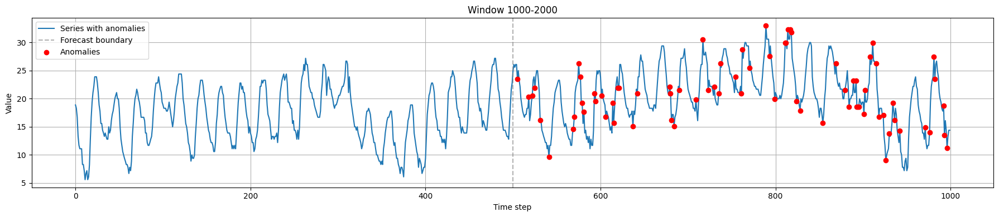

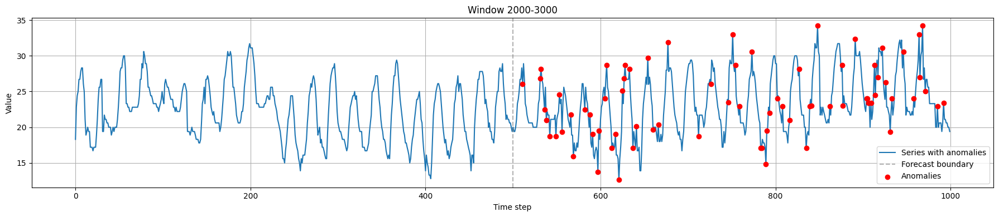

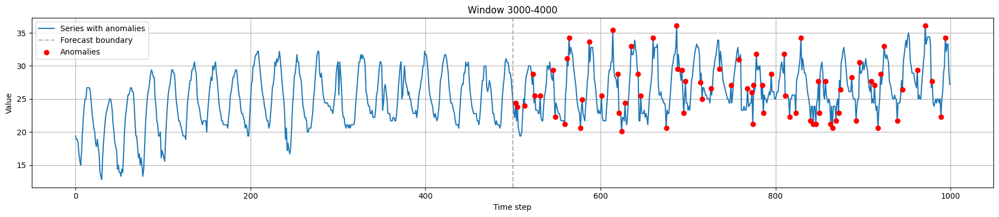

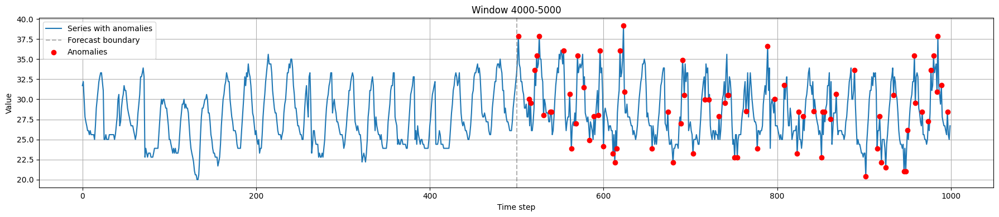

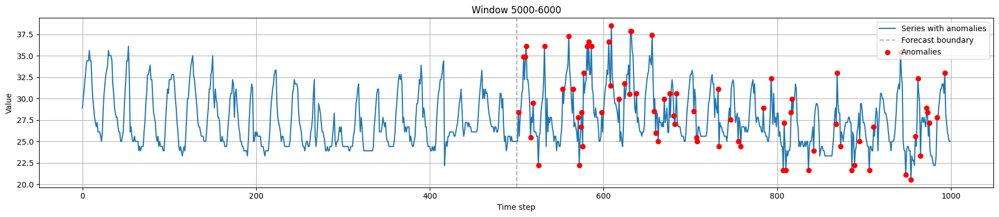

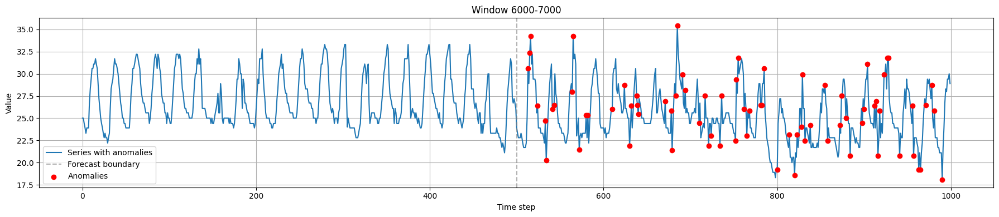

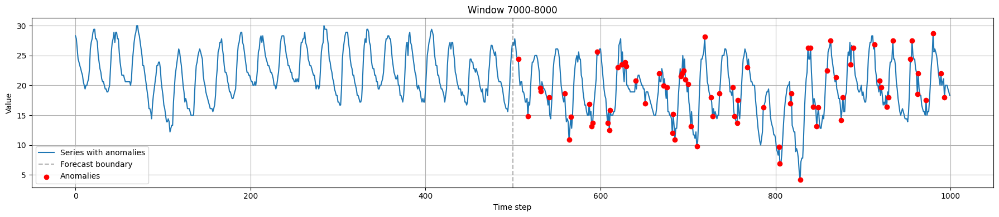

In [15]:
# here we add anomolies to a part of the data. 
# All models are benchmarked by their peroformance in detecting these anomolies for this portion of the data

def add_anomalies(data, target_col="Consumption", anomaly_col="m_bool", 
                                 anomaly_frac=0.15, min_dev_ratio=0.1):

    if isinstance(data, (np.ndarray, list)):
        data = pd.DataFrame({target_col: data})
    else:
        data = data.copy()

    n = len(data)
    n_anomalies = int(anomaly_frac * n)
    indices = np.random.choice(data.index, size=n_anomalies, replace=False)

    avg_load = data[target_col].mean()
    min_deviation = min_dev_ratio * avg_load


    data[f"m_{target_col}"] = data[target_col]
    data[anomaly_col] = False


    for idx in indices:
        original = data.at[idx, target_col]
        deviation = max(0.1 * original, min_deviation)

        if np.random.rand() < 0.5:
            new_val = original - deviation
        else:
            new_val = original + deviation
        data.at[idx, f"m_{target_col}"] = new_val
        data.at[idx, anomaly_col] = True

    return data

from copy import deepcopy
all_windows = []     
all_labels = []


for i in range(1000, 8000, 1000):
    context = data[i:i+500]
    forecast = data[i+500:i+1000]

    data_with_anomalies = add_anomalies(
        forecast,
        target_col="Consumption",
        anomaly_col="m_bool",
        anomaly_frac=0.15,
        min_dev_ratio=0.1
    )

    modified_forecast = data_with_anomalies["m_Consumption"].values
    anomaly_labels = data_with_anomalies["m_bool"].values.astype(bool)

    full_series = np.concatenate((context, modified_forecast))

    all_windows.append(full_series)
    all_labels.append(anomaly_labels)

    plt.figure(figsize=(18, 4))
    plt.plot(full_series, label="Series with anomalies")
    plt.axvline(x=500, color="gray", linestyle="--", alpha=0.6, label="Forecast boundary")

    anomaly_indices = np.where(anomaly_labels)[0] + 500
    plt.scatter(anomaly_indices, full_series[anomaly_indices],
                color="red", label="Anomalies", zorder=5)

    plt.title(f"Window {i}-{i+1000}")
    plt.xlabel("Time step")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [18]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def chronos_stepwise_forecast(input_data, pipeline,
                                          context_window=500,
                                          forecast_window=500,
                                          quantile_levels=[0.1, 0.5, 0.9]):
    
    
    low_preds, med_preds, high_preds = [], [], []

    context = list(input_data[0:context_window])

    for t in range(context_window, forecast_window+context_window):
        context_tensor = torch.tensor(context, dtype=torch.float32)

        quantiles, mean = pipeline.predict_quantiles(
            context=context_tensor,
            prediction_length=1,
            quantile_levels=quantile_levels
        )

        low_preds.append(quantiles[0, 0, 0])
        med_preds.append(quantiles[0, 0, 1])
        high_preds.append(quantiles[0, 0, 2])

        context.append(input_data[t])
        context.pop(0)

    return low_preds, med_preds, high_preds



In [ ]:
all_low_preds = []
all_med_preds = []
all_high_preds = []

for idx, window in enumerate(all_windows):
    print(f"running model on window {idx + 1}...")

    low_preds, med_preds, high_preds = chronos_stepwise_forecast(window, pipeline)

    all_low_preds.append(np.array(low_preds))
    all_med_preds.append(np.array(med_preds))
    all_high_preds.append(np.array(high_preds))

Running Chronos on window 1...
Running Chronos on window 2...
Running Chronos on window 3...
Running Chronos on window 4...
Running Chronos on window 5...
Running Chronos on window 6...
Running Chronos on window 7...


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score

def evaluate_and_plot_window(
    window,                
    anomaly_labels,     
    low_preds,             
    med_preds,          
    high_preds,          
    title="Anomalies Detected vs. Not Detected (Chronos)"
):
    anomaly_data = window[500:]  # forecast region
    anomaly_labels = anomaly_labels.astype(bool)

    low_preds_p = np.array(low_preds)
    high_preds_p = np.array(high_preds)

    anomaly_indices = np.where(anomaly_labels)[0]
    anomaly_data_subset = anomaly_data[anomaly_indices]
    anomaly_low_preds = low_preds_p[anomaly_indices]
    anomaly_high_preds = high_preds_p[anomaly_indices]

    anomaly_outside_preds = np.logical_or(
        anomaly_data_subset < anomaly_low_preds,
        anomaly_data_subset > anomaly_high_preds
    )
    num_anomalies_detected = np.sum(anomaly_outside_preds)
    num_anomalies = len(anomaly_indices)

    non_anomaly_indices = np.where(anomaly_labels == False)[0]
    non_anomaly_data_subset = anomaly_data[non_anomaly_indices]
    non_anomaly_low_preds = low_preds_p[non_anomaly_indices]
    non_anomaly_high_preds = high_preds_p[non_anomaly_indices]

    non_anomaly_outside_preds = np.logical_or(
        non_anomaly_data_subset < non_anomaly_low_preds,
        non_anomaly_data_subset > non_anomaly_high_preds
    )
    num_false_positives = np.sum(non_anomaly_outside_preds)
    num_non_anomalies = len(non_anomaly_indices)

    TP = num_anomalies_detected
    FP = num_false_positives
    FN = num_anomalies - TP
    TN = num_non_anomalies - FP

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

    print("\nConfusion Matrix:")
    print(f"TP: {TP}, FP: {FP}, FN: {FN}, TN: {TN}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

    detected_indices = anomaly_indices[anomaly_outside_preds]
    missed_indices = anomaly_indices[~anomaly_outside_preds]
    detected_values = anomaly_data_subset[anomaly_outside_preds]
    missed_values = anomaly_data_subset[~anomaly_outside_preds]

    plt.figure(figsize=(30, 8))
    plt.plot(window, color="green", label="All data")
    plt.plot(range(500, 1000), med_preds, color="red", label="Median forecast")
    plt.fill_between(range(500, 1000), low_preds, high_preds, color="tomato", alpha=0.3, label="80% PI")
    plt.scatter(detected_indices + 500, detected_values, color="blue", label="Detected Anomalies")
    plt.scatter(missed_indices + 500, missed_values, color="orange", label="Missed Anomalies")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(window[800:], color="green", label="Ground truth")
    plt.plot(range(0, 200), med_preds[300:], color="red", label="Median forecast")
    plt.fill_between(range(0, 200), low_preds[300:], high_preds[300:], color="tomato", alpha=0.3, label="80% PI")
    plt.scatter(detected_indices[detected_indices > 300] - 300, detected_values[detected_indices > 300],
                color="blue", label="Detected")
    plt.scatter(missed_indices[missed_indices > 300] - 300, missed_values[missed_indices > 300],
                color="orange", label="Missed")
    plt.title(f"{title} (Zoomed In)")
    plt.xlabel("Time Step")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    return TP, FP, FN, TN, precision, recall, f1



Confusion Matrix:
TP: 60, FP: 82, FN: 15, TN: 343
Precision: 0.4225, Recall: 0.8000, F1 Score: 0.5530


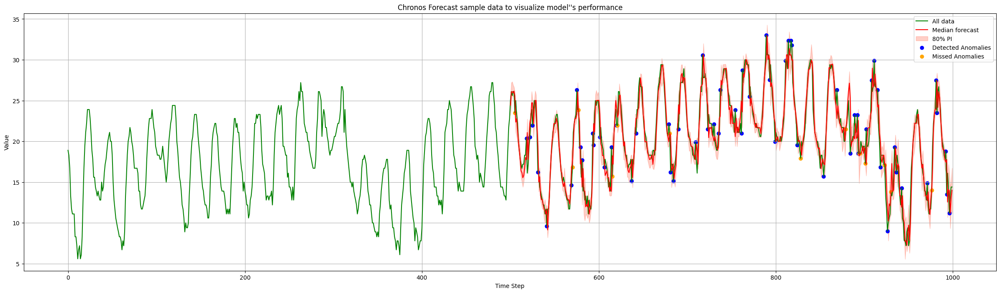

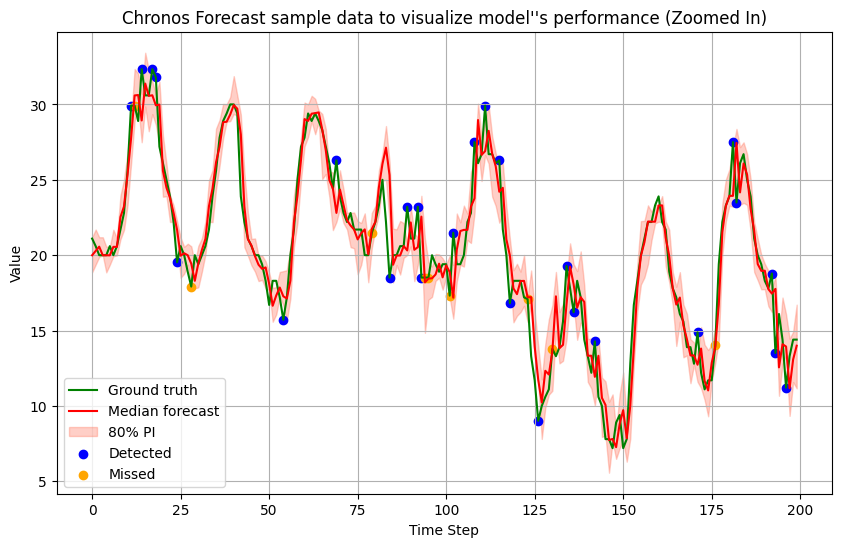

In [ ]:
# plot the data of one of hte windows for visualization
TP, FP, FN, TN, p, r, f1 = evaluate_and_plot_window(
    all_windows[0],
    all_labels[0],
    all_low_preds[0],
    all_med_preds[0],
    all_high_preds[0],
    title="Chronos Forecast sample data to visualize model''s performance"
)


In [ ]:
# calcualte metrics for all windows (1000 points each)
total_TP = total_FP = total_FN = total_TN = 0

for i in range(len(all_windows)):
    window = all_windows[i]
    labels = all_labels[i]
    low_preds = all_low_preds[i]
    high_preds = all_high_preds[i]

    true_vals = window[500:]

    anomaly_indices = np.where(labels == True)[0]
    non_anomaly_indices = np.where(labels == False)[0]

    anomaly_vals = true_vals[anomaly_indices]
    anomaly_low = low_preds[anomaly_indices]
    anomaly_high = high_preds[anomaly_indices]

    detected_anomalies = np.logical_or(
        anomaly_vals < anomaly_low,
        anomaly_vals > anomaly_high
    )
    TP = np.sum(detected_anomalies)
    FN = len(anomaly_indices) - TP

    non_anomaly_vals = true_vals[non_anomaly_indices]
    non_anomaly_low = low_preds[non_anomaly_indices]
    non_anomaly_high = high_preds[non_anomaly_indices]

    false_positives = np.logical_or(
        non_anomaly_vals < non_anomaly_low,
        non_anomaly_vals > non_anomaly_high
    )
    FP = np.sum(false_positives)
    TN = len(non_anomaly_indices) - FP

    total_TP += TP
    total_FP += FP
    total_FN += FN
    total_TN += TN

precision = total_TP / (total_TP + total_FP) if (total_TP + total_FP) > 0 else 0
recall = total_TP / (total_TP + total_FN) if (total_TP + total_FN) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {total_TP}")
print(f"False Positives (FP): {total_FP}")
print(f"False Negatives (FN): {total_FN}")
print(f"True Negatives (TN): {total_TN}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")


=== Aggregated Metrics Across All Windows ===
True Positives (TP): 457
False Positives (FP): 583
False Negatives (FN): 68
True Negatives (TN): 2392
Precision: 0.4394
Recall:    0.8705
F1 Score:  0.5840


## chornos base

In [ ]:
pipeline = BaseChronosPipeline.from_pretrained(
    "amazon/chronos-t5-base",
    device_map="cuda",  
    torch_dtype=torch.bfloat16,
)

all_low_preds = []
all_med_preds = []
all_high_preds = []

for idx, window in enumerate(all_windows):
    print(f"running model on window {idx + 1}...")

    low_preds, med_preds, high_preds = chronos_stepwise_forecast(window, pipeline)

    all_low_preds.append(np.array(low_preds))
    all_med_preds.append(np.array(med_preds))
    all_high_preds.append(np.array(high_preds))

running model on window 1...
running model on window 2...
running model on window 3...
running model on window 4...
running model on window 5...
running model on window 6...
running model on window 7...



Confusion Matrix:
TP: 57, FP: 59, FN: 18, TN: 366
Precision: 0.4914, Recall: 0.7600, F1 Score: 0.5969


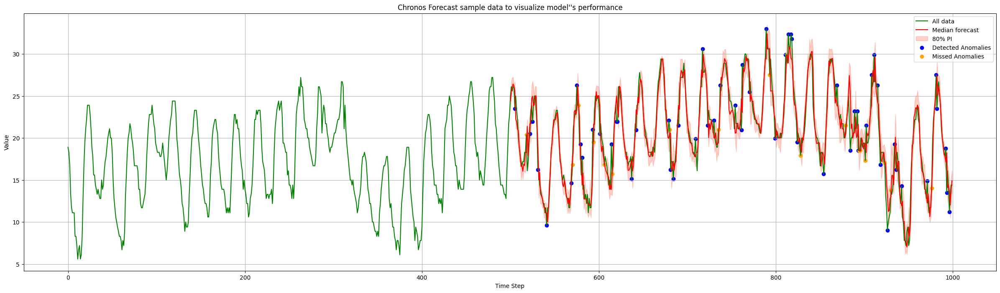

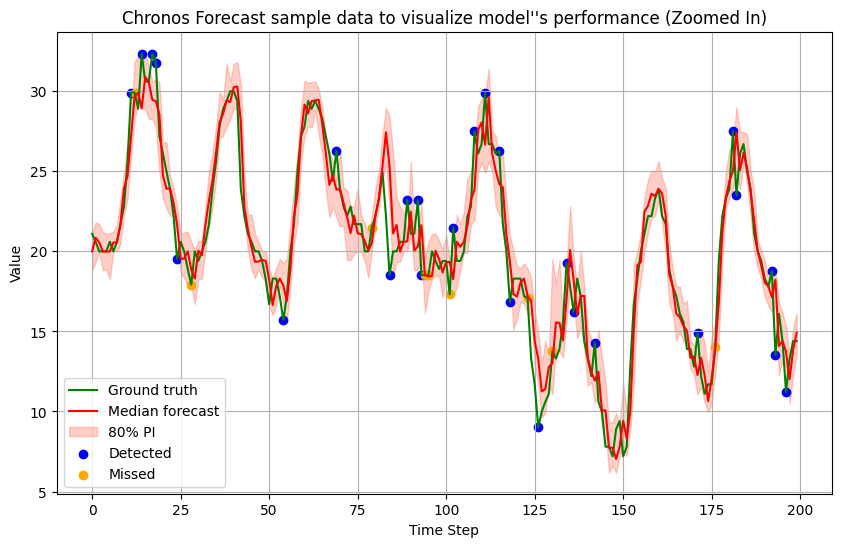

In [ ]:
 # visualize the data of one of the windows
TP, FP, FN, TN, p, r, f1 = evaluate_and_plot_window(
    all_windows[0],
    all_labels[0],
    all_low_preds[0],
    all_med_preds[0],
    all_high_preds[0],
    title="Chronos Forecast sample data to visualize model''s performance"
)


In [ ]:
# calcualte metrics for all windows (1000 points each)
total_TP = total_FP = total_FN = total_TN = 0

for i in range(len(all_windows)):
    window = all_windows[i]
    labels = all_labels[i]
    low_preds = all_low_preds[i]
    high_preds = all_high_preds[i]

    true_vals = window[500:]

    anomaly_indices = np.where(labels == True)[0]
    non_anomaly_indices = np.where(labels == False)[0]

    anomaly_vals = true_vals[anomaly_indices]
    anomaly_low = low_preds[anomaly_indices]
    anomaly_high = high_preds[anomaly_indices]

    detected_anomalies = np.logical_or(
        anomaly_vals < anomaly_low,
        anomaly_vals > anomaly_high
    )
    TP = np.sum(detected_anomalies)
    FN = len(anomaly_indices) - TP

    non_anomaly_vals = true_vals[non_anomaly_indices]
    non_anomaly_low = low_preds[non_anomaly_indices]
    non_anomaly_high = high_preds[non_anomaly_indices]

    false_positives = np.logical_or(
        non_anomaly_vals < non_anomaly_low,
        non_anomaly_vals > non_anomaly_high
    )
    FP = np.sum(false_positives)
    TN = len(non_anomaly_indices) - FP

    total_TP += TP
    total_FP += FP
    total_FN += FN
    total_TN += TN

precision = total_TP / (total_TP + total_FP) if (total_TP + total_FP) > 0 else 0
recall = total_TP / (total_TP + total_FN) if (total_TP + total_FN) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {total_TP}")
print(f"False Positives (FP): {total_FP}")
print(f"False Negatives (FN): {total_FN}")
print(f"True Negatives (TN): {total_TN}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")

=== Aggregated Metrics Across All Windows ===
True Positives (TP): 441
False Positives (FP): 517
False Negatives (FN): 84
True Negatives (TN): 2458
Precision: 0.4603
Recall:    0.8400
F1 Score:  0.5947


# chronos tiny

In [ ]:
pipeline = BaseChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda",  
    torch_dtype=torch.bfloat16,
)

all_low_preds = []
all_med_preds = []
all_high_preds = []

for idx, window in enumerate(all_windows):
    print(f"running model on window {idx + 1}...")

    low_preds, med_preds, high_preds = chronos_stepwise_forecast(window, pipeline)

    all_low_preds.append(np.array(low_preds))
    all_med_preds.append(np.array(med_preds))
    all_high_preds.append(np.array(high_preds))

running model on window 1...
running model on window 2...
running model on window 3...
running model on window 4...
running model on window 5...
running model on window 6...
running model on window 7...



Confusion Matrix:
TP: 56, FP: 76, FN: 19, TN: 349
Precision: 0.4242, Recall: 0.7467, F1 Score: 0.5411


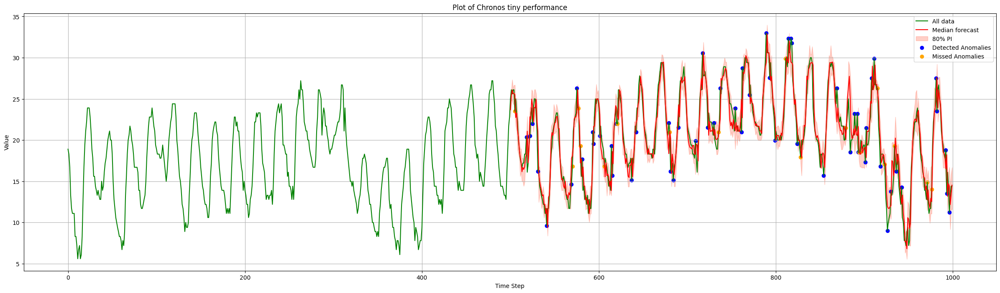

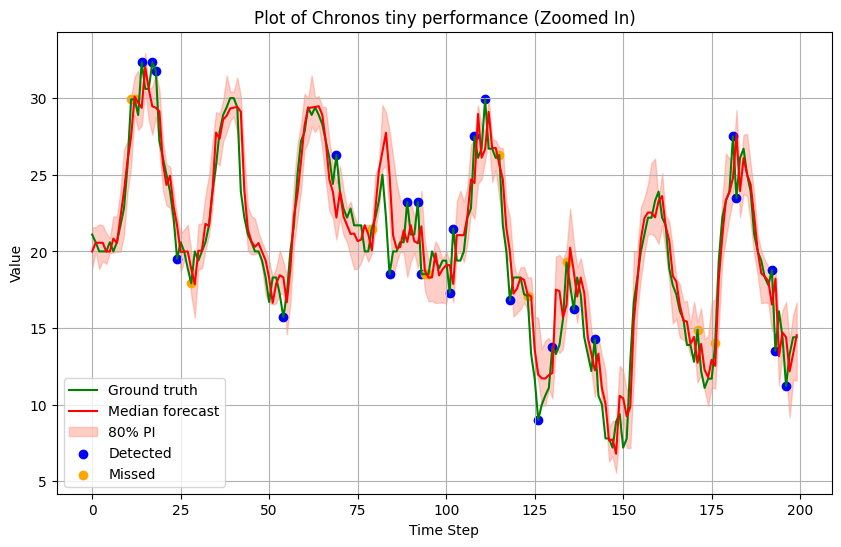

In [ ]:

TP, FP, FN, TN, p, r, f1 = evaluate_and_plot_window(
    all_windows[0],
    all_labels[0],
    all_low_preds[0],
    all_med_preds[0],
    all_high_preds[0],
    title="Plot of Chronos tiny performance"
)


In [ ]:

total_TP = total_FP = total_FN = total_TN = 0

for i in range(len(all_windows)):
    window = all_windows[i]
    labels = all_labels[i]
    low_preds = all_low_preds[i]
    high_preds = all_high_preds[i]

    true_vals = window[500:]

    anomaly_indices = np.where(labels == True)[0]
    non_anomaly_indices = np.where(labels == False)[0]

    anomaly_vals = true_vals[anomaly_indices]
    anomaly_low = low_preds[anomaly_indices]
    anomaly_high = high_preds[anomaly_indices]

    detected_anomalies = np.logical_or(
        anomaly_vals < anomaly_low,
        anomaly_vals > anomaly_high
    )
    TP = np.sum(detected_anomalies)
    FN = len(anomaly_indices) - TP

    non_anomaly_vals = true_vals[non_anomaly_indices]
    non_anomaly_low = low_preds[non_anomaly_indices]
    non_anomaly_high = high_preds[non_anomaly_indices]

    false_positives = np.logical_or(
        non_anomaly_vals < non_anomaly_low,
        non_anomaly_vals > non_anomaly_high
    )
    FP = np.sum(false_positives)
    TN = len(non_anomaly_indices) - FP

    total_TP += TP
    total_FP += FP
    total_FN += FN
    total_TN += TN

precision = total_TP / (total_TP + total_FP) if (total_TP + total_FP) > 0 else 0
recall = total_TP / (total_TP + total_FN) if (total_TP + total_FN) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {total_TP}")
print(f"False Positives (FP): {total_FP}")
print(f"False Negatives (FN): {total_FN}")
print(f"True Negatives (TN): {total_TN}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")

=== Aggregated Metrics Across All Windows ===
True Positives (TP): 429
False Positives (FP): 572
False Negatives (FN): 96
True Negatives (TN): 2403
Precision: 0.4286
Recall:    0.8171
F1 Score:  0.5623


# chronos large

In [65]:
pipeline = BaseChronosPipeline.from_pretrained(
    "amazon/chronos-t5-large",
    device_map="cuda",  
    torch_dtype=torch.bfloat16,
)

(1000,)
Number of anomalies detected (true positives): 53
Total anomalies in data: 75
Percentage of anomalies detected: 70.67%

Number of false positives: 68
Total non-anomaly points: 425
False positive rate: 16.00%

Confusion Matrix:
True Positives (TP): 53
False Positives (FP): 68
False Negatives (FN): 22
True Negatives (TN): 357

Precision: 0.4380
Recall:    0.7067
F1 Score:  0.5408


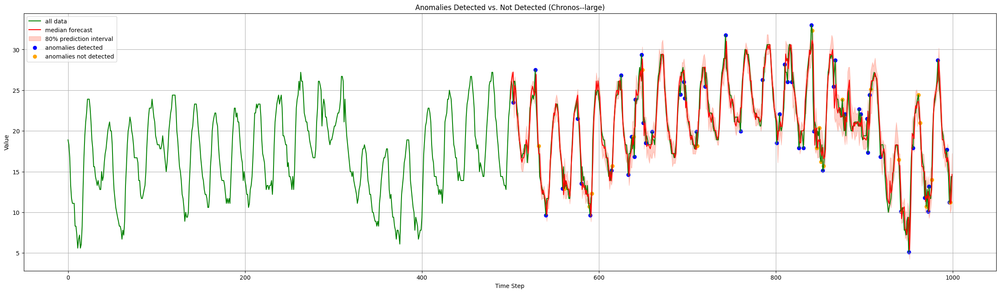

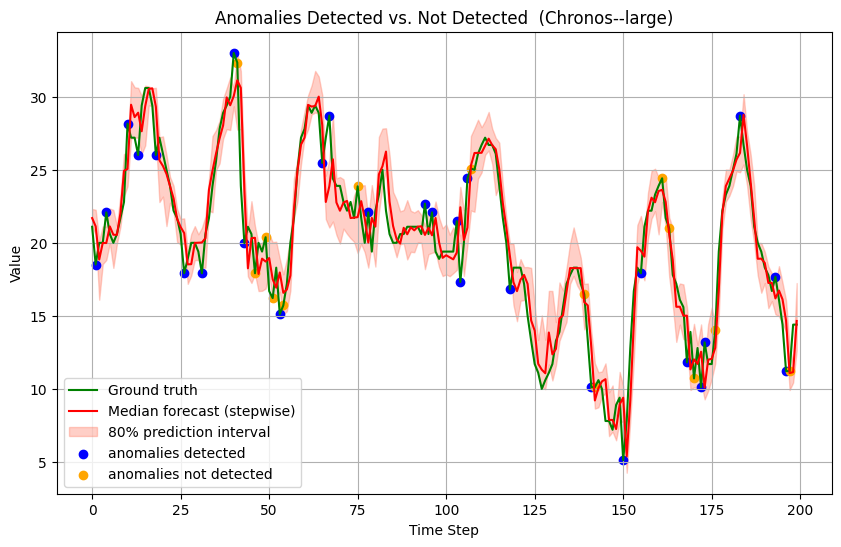

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def chronos_stepwise_forecast(input_data, pipeline,
                                          context_window=500,
                                          forecast_window=500,
                                          quantile_levels=[0.1, 0.5, 0.9]):
    
    
    low_preds, med_preds, high_preds = [], [], []

    context = list(input_data[0:context_window])

    for t in range(context_window, forecast_window+context_window):
        context_tensor = torch.tensor(context, dtype=torch.float32)

        quantiles, mean = pipeline.predict_quantiles(
            context=context_tensor,
            prediction_length=1,
            quantile_levels=quantile_levels
        )

        low_preds.append(quantiles[0, 0, 0])
        med_preds.append(quantiles[0, 0, 1])
        high_preds.append(quantiles[0, 0, 2])

        context.append(input_data[t])
        context.pop(0)

    return low_preds, med_preds, high_preds

# concatenate the data with anomalies and the original data. This is used to give to Chronos for prediction. 
# We have a window of 500 and we predict one point at a time for 500 points.

anomaly_data = data_with_anomalies["m_Consumption"].values 
all = np.concatenate((data[1000:1500], anomaly_data))
print(all.shape)

# now apply the funciton above to the all data and plot the results
low_preds, med_preds, high_preds = chronos_stepwise_forecast(all, pipeline)


anomaly_data = data_with_anomalies["m_Consumption"].values
anomaly_labels = data_with_anomalies["m_bool"].values


low_preds_p = np.array(low_preds)
high_preds_p = np.array(high_preds)

#  true positives (anomalies detected)
anomaly_indices = np.where(anomaly_labels == True)[0]
anomaly_low_preds = low_preds_p[anomaly_indices]
anomaly_high_preds = high_preds_p[anomaly_indices]
anomaly_data_subset = anomaly_data[anomaly_indices]

# detected anomalies
anomaly_outside_preds = np.logical_or(
    anomaly_data_subset < anomaly_low_preds,
    anomaly_data_subset > anomaly_high_preds
)

# count anomalies detected
num_anomalies_detected = np.sum(anomaly_outside_preds)
num_anomalies = len(anomaly_indices)

# false positives (non-anomalies detected as anomalies)
non_anomaly_indices = np.where(anomaly_labels == False)[0]
non_anomaly_low_preds = low_preds_p[non_anomaly_indices]
non_anomaly_high_preds = high_preds_p[non_anomaly_indices]
non_anomaly_data_subset = anomaly_data[non_anomaly_indices]

non_anomaly_outside_preds = np.logical_or(
    non_anomaly_data_subset < non_anomaly_low_preds,
    non_anomaly_data_subset > non_anomaly_high_preds
)

# ccount false positives
num_false_positives = np.sum(non_anomaly_outside_preds)
num_non_anomalies = len(non_anomaly_indices)

print(f"Number of anomalies detected (true positives): {num_anomalies_detected}")
print(f"Total anomalies in data: {num_anomalies}")
print(f"Percentage of anomalies detected: {num_anomalies_detected / num_anomalies * 100:.2f}%\n")

print(f"Number of false positives: {num_false_positives}")
print(f"Total non-anomaly points: {num_non_anomalies}")
print(f"False positive rate: {num_false_positives / num_non_anomalies * 100:.2f}%")

detected_indices = anomaly_indices[anomaly_outside_preds]
missed_indices = anomaly_indices[~anomaly_outside_preds]

detected_values = anomaly_data_subset[anomaly_outside_preds]
missed_values = anomaly_data_subset[~anomaly_outside_preds]

from sklearn.metrics import precision_score, recall_score, f1_score

TP = num_anomalies_detected  
FP = num_false_positives     
FN = num_anomalies - TP     
TN = num_non_anomalies - FP

print("\nConfusion Matrix:")
print(f"True Positives (TP): {TP}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Negatives (TN): {TN}")

precision = TP / (TP + FP) if (TP + FP) > 0 else 0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"\nPrecision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")

plt.figure(figsize=(30, 8))
plt.plot(all, color="green", label="all data")
plt.plot(range(500, 1000), med_preds, color="red", label="median forecast")
plt.fill_between(range(500, 1000), low_preds, high_preds, color="tomato", alpha=0.3, label="80% prediction interval")
plt.scatter(detected_indices + 500, detected_values, color="blue", label="anomalies detected")
plt.scatter(missed_indices + 500, missed_values, color="orange", label="anomalies not detected")
plt.title("Anomalies Detected vs. Not Detected (Chronos--large)")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.legend()
plt.grid()
plt.show()

# plotting another graph of only the second half of the data (anomalous part)


plt.figure(figsize=(10, 6))
plt.plot(all[800:], color="green", label="Ground truth")
plt.plot(range(0,200) ,med_preds[300:], color="red", label="Median forecast (stepwise)")
plt.fill_between(range(0,200), low_preds[300:], high_preds[300:], color="tomato", alpha=0.3, label="80% prediction interval")
# plt.scatter(detected_indices, detected_values, color="blue", label="anomalies detected")
# plt.scatter(missed_indices, missed_values, color="orange", label="anomalies not detected")
#only plot scatter points that are more than 300. I removed the first 300. so shift the indices by 300
plt.scatter(detected_indices[detected_indices > 300] - 300, detected_values[detected_indices > 300], color="blue", label="anomalies detected")
plt.scatter(missed_indices[missed_indices > 300] - 300, missed_values[missed_indices > 300], color="orange", label="anomalies not detected")
plt.title("Anomalies Detected vs. Not Detected  (Chronos--large)")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.legend()
plt.grid()
plt.show()



# TimeGPT-1 

In [40]:
import pandas as pd
from nixtla import NixtlaClient

In [ ]:
nixtla_client = NixtlaClient(api_key = 'nixak-TXKqEATPrKMuC0Si7Hk8uZXy5RL0gTQ628SvRKs3mwAiSVWw6zKtNASRGOqqv5nAKQ4yU29SwtcOybkW') # my api key to access timegpt

In [42]:
ds = pd.date_range(start='2023-01-01', periods=len(data[1000:1500]), freq='1H')

df = pd.DataFrame({
    'unique_id': 'signal_1',
    'ds': ds,
    'y': data[1000:1500]
})

fcst_df = nixtla_client.forecast(df, h=100, level=[80])
fcst_df.head()

INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Querying model metadata...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...


,unique_id,ds,TimeGPT,TimeGPT-hi-80,TimeGPT-lo-80
0,signal_1,2023-01-21 20:00:00,23.954979,24.903461,23.006496
1,signal_1,2023-01-21 21:00:00,24.870174,26.026205,23.714144
2,signal_1,2023-01-21 22:00:00,25.285984,26.986198,23.585770
3,signal_1,2023-01-21 23:00:00,25.725502,27.885738,23.565266
4,signal_1,2023-01-22 00:00:00,25.474003,27.472363,23.475643


In [43]:
import pandas as pd
import numpy as np
from tqdm import tqdm

def timegpt_stepwise_forecast(input_data,
                               nixtla_client,
                               context_window=500,
                               forecast_window=500,
                               level=80,
                               freq="1H"):

    low_preds, med_preds, high_preds = [], [], []

    context = list(input_data[0:context_window])

    for t in tqdm(range(context_window, forecast_window + context_window)):
        ds = pd.date_range(start='2023-01-01', periods=context_window, freq=freq)
        df = pd.DataFrame({
            'unique_id': 'signal_1',
            'ds': ds,
            'y': context
        })

        fcst_df = nixtla_client.forecast(df, h=1, level=[level])

        low = fcst_df[f"TimeGPT-lo-{level}"].values[0]
        mid = fcst_df["TimeGPT"].values[0]
        high =fcst_df[f"TimeGPT-hi-{level}"].values[0]

        low_preds.append(low)
        med_preds.append(mid)
        high_preds.append(high)

        context.append(input_data[t])
        context.pop(0)

    return np.array(low_preds), np.array(med_preds), np.array(high_preds)


In [ ]:
all_low_preds_tgpt = []
all_med_preds_tgpt = []
all_high_preds_tgpt = []

for i, window in enumerate(all_windows):
    print(f"Running TimeGPT on window {i + 1}...")

    low_preds, med_preds, high_preds = timegpt_stepwise_forecast(
        input_data=window,
        nixtla_client=nixtla_client,
        context_window=500,
        forecast_window=500,
        level=80,
        freq="1H" 
    )

    all_low_preds_tgpt.append(low_preds)
    all_med_preds_tgpt.append(med_preds)
    all_high_preds_tgpt.append(high_preds)

Running TimeGPT on window 1...


  0%|          | 0/500 [00:00<?, ?it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 1/500 [00:00<06:39,  1.25it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 2/500 [00:02<08:53,  1.07s/it]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  1%|          | 3/500 [00:03<09:50,  1.19s/it]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred 

Running TimeGPT on window 2...


  0%|          | 0/500 [00:00<?, ?it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 1/500 [00:00<05:55,  1.41it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 2/500 [00:01<05:56,  1.40it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  1%|          | 3/500 [00:02<05:55,  1.40it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred 

Running TimeGPT on window 3...


  0%|          | 0/500 [00:00<?, ?it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 1/500 [00:00<06:18,  1.32it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 2/500 [00:01<06:21,  1.31it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  1%|          | 3/500 [00:02<06:18,  1.31it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred 

Running TimeGPT on window 4...


  0%|          | 0/500 [00:00<?, ?it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 1/500 [00:00<05:45,  1.44it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 2/500 [00:01<06:48,  1.22it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  1%|          | 3/500 [00:02<06:31,  1.27it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred 

Running TimeGPT on window 5...


  0%|          | 0/500 [00:00<?, ?it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 1/500 [00:00<06:07,  1.36it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 2/500 [00:01<06:25,  1.29it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  1%|          | 3/500 [00:02<07:02,  1.18it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred 

Running TimeGPT on window 6...


  0%|          | 0/500 [00:00<?, ?it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 1/500 [00:00<06:26,  1.29it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 2/500 [00:01<07:25,  1.12it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  1%|          | 3/500 [00:02<07:04,  1.17it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred 

Running TimeGPT on window 7...


  0%|          | 0/500 [00:00<?, ?it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 1/500 [00:00<07:06,  1.17it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  0%|          | 2/500 [00:01<07:07,  1.17it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: H
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Restricting input...
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...
  1%|          | 3/500 [00:02<06:57,  1.19it/s]INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred 


Confusion Matrix:
TP: 56, FP: 101, FN: 19, TN: 324
Precision: 0.3567, Recall: 0.7467, F1 Score: 0.4828


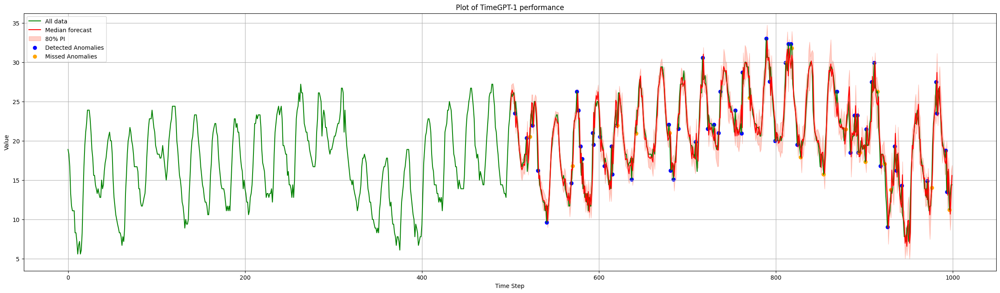

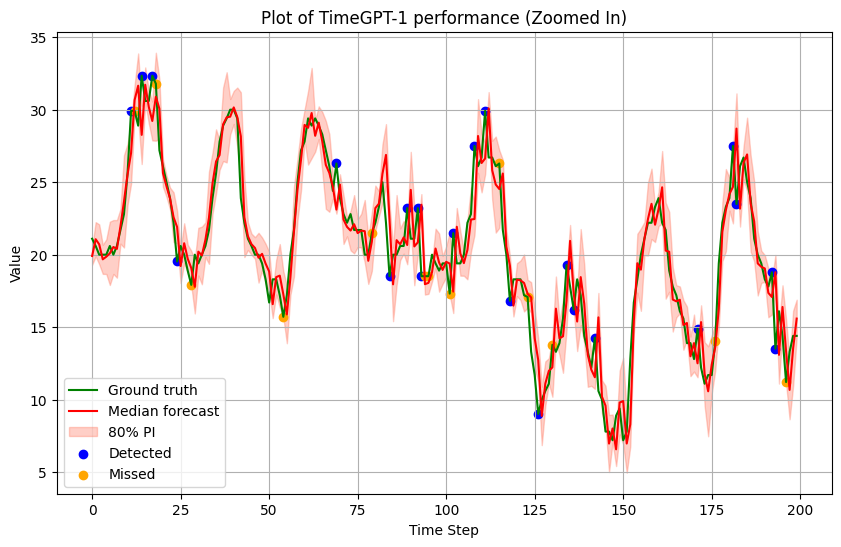

In [ ]:

TP, FP, FN, TN, p, r, f1 = evaluate_and_plot_window(
    all_windows[0],
    all_labels[0],
    all_low_preds_tgpt[0],
    all_med_preds_tgpt[0],
    all_high_preds_tgpt[0],
    title="Plot of TimeGPT-1 performance"
)

In [ ]:

total_TP = total_FP = total_FN = total_TN = 0

for i in range(len(all_windows)):
    window = all_windows[i]
    labels = all_labels[i]
    low_preds = all_low_preds_tgpt[i]
    high_preds = all_high_preds_tgpt[i]

    true_vals = window[500:]

    anomaly_indices = np.where(labels == True)[0]
    non_anomaly_indices = np.where(labels == False)[0]

    anomaly_vals = true_vals[anomaly_indices]
    anomaly_low = low_preds[anomaly_indices]
    anomaly_high = high_preds[anomaly_indices]

    detected_anomalies = np.logical_or(
        anomaly_vals < anomaly_low,
        anomaly_vals > anomaly_high
    )
    TP = np.sum(detected_anomalies)
    FN = len(anomaly_indices) - TP

    non_anomaly_vals = true_vals[non_anomaly_indices]
    non_anomaly_low = low_preds[non_anomaly_indices]
    non_anomaly_high = high_preds[non_anomaly_indices]

    false_positives = np.logical_or(
        non_anomaly_vals < non_anomaly_low,
        non_anomaly_vals > non_anomaly_high
    )
    FP = np.sum(false_positives)
    TN = len(non_anomaly_indices) - FP

    total_TP += TP
    total_FP += FP
    total_FN += FN
    total_TN += TN

precision = total_TP / (total_TP + total_FP) if (total_TP + total_FP) > 0 else 0
recall = total_TP / (total_TP + total_FN) if (total_TP + total_FN) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {total_TP}")
print(f"False Positives (FP): {total_FP}")
print(f"False Negatives (FN): {total_FN}")
print(f"True Negatives (TN): {total_TN}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")

True Positives (TP): 428
False Positives (FP): 702
False Negatives (FN): 97
True Negatives (TN): 2273
Precision: 0.3788
Recall:    0.8152
F1 Score:  0.5172


# EnbPI

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from mapie.time_series_regression import MapieTimeSeriesRegressor
from mapie.subsample import BlockBootstrap

context_size = 499
train_range = (0, 1500)
test_range = (1500, 2000)
test_context_start = test_range[0] - context_size 

test_with_context = data[test_context_start:test_range[1]]

df_test = pd.DataFrame({
    "ds": pd.date_range("2023-01-01", periods=len(test_with_context), freq="H"),
    "y": test_with_context
})

for lag in range(1, context_size + 1):
    df_test[f"lag_{lag}"] = df_test["y"].shift(lag)
df_test.dropna(inplace=True)

X_test = df_test[[f"lag_{lag}" for lag in range(1, context_size + 1)]]
y_test = df_test["y"]

train_data = data[train_range[0]:train_range[1]]
df_train = pd.DataFrame({
    "ds": pd.date_range("2022-01-01", periods=len(train_data), freq="H"),
    "y": train_data
})

for lag in range(1, context_size + 1):
    df_train[f"lag_{lag}"] = df_train["y"].shift(lag)
df_train.dropna(inplace=True)

X_train = df_train[[f"lag_{lag}" for lag in range(1, context_size + 1)]]
y_train = df_train["y"]

model = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=0)
cv = BlockBootstrap(n_resamplings=10, length=24, random_state=0)
mapie = MapieTimeSeriesRegressor(estimator=model, method="enbpi", cv=cv, agg_function="mean")
mapie.fit(X_train, y_train)

y_pred, y_pis = mapie.predict(X_test, alpha=0.2)

C:\Users\navid-pc\AppData\Local\Temp\ipykernel_19608\1368472887.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_test[f"lag_{lag}"] = df_test["y"].shift(lag)
C:\Users\navid-pc\AppData\Local\Temp\ipykernel_19608\1368472887.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_test[f"lag_{lag}"] = df_test["y"].shift(lag)
C:\Users\navid-pc\AppData\Local\Temp\ipykernel_19608\1368472887.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor 

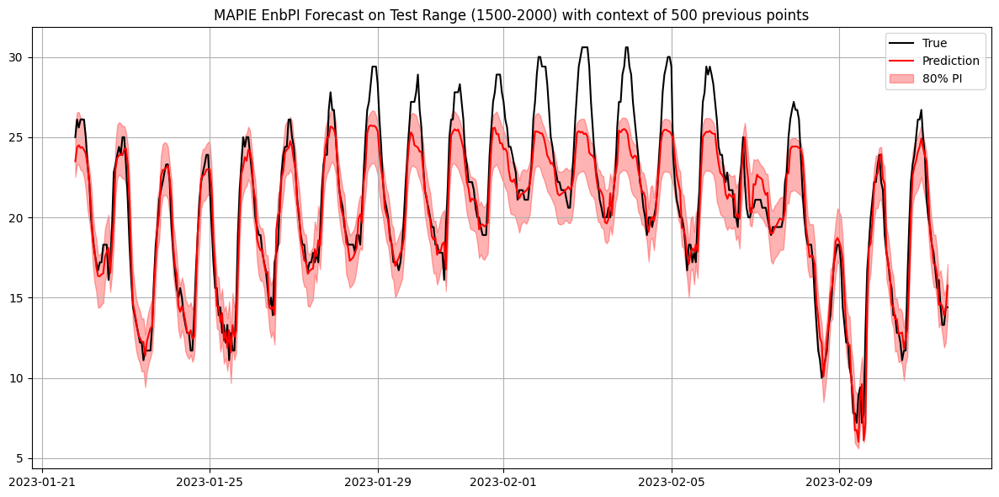

In [39]:
plt.figure(figsize=(12, 6))
plt.plot(df_test["ds"], y_test, label="True", color="black")
plt.plot(df_test["ds"], y_pred, label="Prediction", color="red")
plt.fill_between(df_test["ds"], y_pis[:, 0, 0], y_pis[:, 1, 0],
                 color="red", alpha=0.3, label="80% PI")
plt.title("MAPIE EnbPI Forecast on Test Range (1500-2000) with context of 500 previous points")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\navid-pc\AppData\Local\Temp\ipykernel_19608\2834158788.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_test[f"lag_{lag}"] = df_test["y"].shift(lag)
C:\Users\navid-pc\AppData\Local\Temp\ipykernel_19608\2834158788.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_test[f"lag_{lag}"] = df_test["y"].shift(lag)
C:\Users\navid-pc\AppData\Local\Temp\ipykernel_19608\2834158788.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor 

Number of anomalies detected (true positives): 46
Total anomalies in data: 75
Percentage of anomalies detected: 61.33%

Number of false positives: 138
Total non-anomaly points: 425
False positive rate: 32.47%

Confusion Matrix:
True Positives (TP): 46
False Positives (FP): 138
False Negatives (FN): 29
True Negatives (TN): 287

Precision: 0.2500
Recall:    0.6133
F1 Score:  0.3552


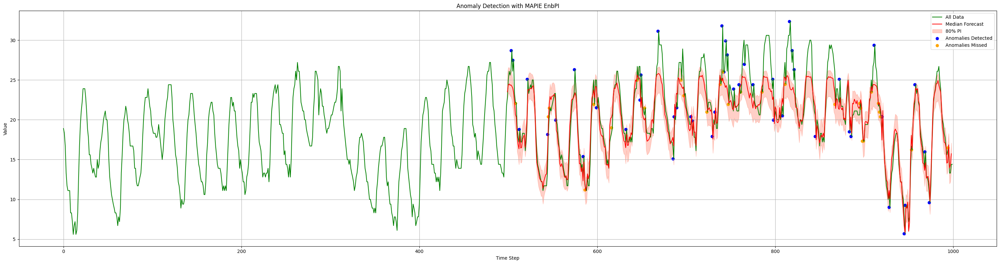

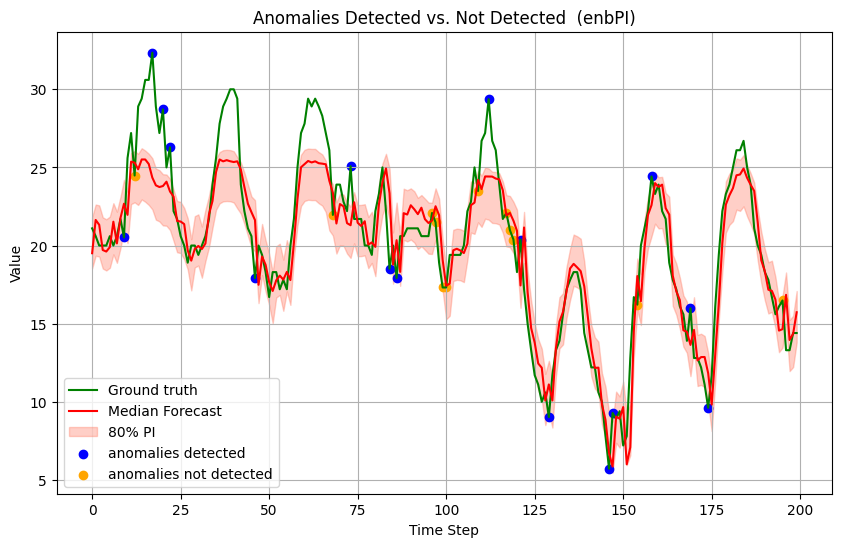

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

anomaly_data = data_with_anomalies["m_Consumption"].values  
anomaly_labels = data_with_anomalies["m_bool"].values       
all_data = np.concatenate([data[1000:1500], anomaly_data])  

df_test = pd.DataFrame({"y": all_data})
for lag in range(1, 500):
    df_test[f"lag_{lag}"] = df_test["y"].shift(lag)

df_test.dropna(inplace=True)

X_all = df_test[[f"lag_{lag}" for lag in range(1, 500)]].values
y_all = df_test["y"].values  

y_pred, y_pis = mapie.predict(X_all, alpha=0.2)
low_preds = y_pis[:, 0, 0]
high_preds = y_pis[:, 1, 0]
med_preds = y_pred

low_preds_p = low_preds[-500:]
high_preds_p = high_preds[-500:]
med_preds_p = med_preds[-500:]

anomaly_indices = np.where(anomaly_labels == True)[0]
non_anomaly_indices = np.where(anomaly_labels == False)[0]

anomaly_data_subset = anomaly_data[anomaly_indices]
anomaly_low_preds = low_preds_p[anomaly_indices]
anomaly_high_preds = high_preds_p[anomaly_indices]

non_anomaly_data_subset = anomaly_data[non_anomaly_indices]
non_anomaly_low_preds = low_preds_p[non_anomaly_indices]
non_anomaly_high_preds = high_preds_p[non_anomaly_indices]

anomaly_outside_preds = (anomaly_data_subset < anomaly_low_preds) | (anomaly_data_subset > anomaly_high_preds)
non_anomaly_outside_preds = (non_anomaly_data_subset < non_anomaly_low_preds) | (non_anomaly_data_subset > non_anomaly_high_preds)

num_anomalies_detected = np.sum(anomaly_outside_preds)
num_anomalies = len(anomaly_indices)
num_false_positives = np.sum(non_anomaly_outside_preds)
num_non_anomalies = len(non_anomaly_indices)

print(f"Number of anomalies detected (true positives): {num_anomalies_detected}")
print(f"Total anomalies in data: {num_anomalies}")
print(f"Percentage of anomalies detected: {num_anomalies_detected / num_anomalies * 100:.2f}%\n")
print(f"Number of false positives: {num_false_positives}")
print(f"Total non-anomaly points: {num_non_anomalies}")
print(f"False positive rate: {num_false_positives / num_non_anomalies * 100:.2f}%")

detected_indices = anomaly_indices[anomaly_outside_preds]
missed_indices = anomaly_indices[~anomaly_outside_preds]
detected_values = anomaly_data_subset[anomaly_outside_preds]
missed_values = anomaly_data_subset[~anomaly_outside_preds]

from sklearn.metrics import precision_score, recall_score, f1_score

TP = num_anomalies_detected 
FP = num_false_positives    
FN = num_anomalies - TP   
TN = num_non_anomalies - FP 

print("\nConfusion Matrix:")
print(f"True Positives (TP): {TP}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Negatives (TN): {TN}")

precision = TP / (TP + FP) if (TP + FP) > 0 else 0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"\nPrecision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")



plt.figure(figsize=(30, 8))
plt.plot(all_data, color="green", label="All Data")
plt.plot(range(499, 999), med_preds_p, color="red", label="Median Forecast")
plt.fill_between(range(499, 999), low_preds_p, high_preds_p, color="tomato", alpha=0.3, label="80% PI")
plt.scatter(detected_indices + 499, detected_values, color="blue", label="Anomalies Detected")
plt.scatter(missed_indices + 499, missed_values, color="orange", label="Anomalies Missed")
plt.title("Anomalies Detected vs. Not Detected (enbPI)")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.legend()
plt.grid()
plt.title("Anomaly Detection with MAPIE EnbPI")
plt.tight_layout()
plt.show()

# plotting another graph of only the second half of the data (anomalous part)


plt.figure(figsize=(10, 6))
plt.plot(all_data[-200:], color="green", label="Ground truth")
plt.plot(range(0, 200), med_preds_p[-200:], color="red", label="Median Forecast")
plt.fill_between(range(0, 200), low_preds_p[-200:], high_preds_p[-200:], color="tomato", alpha=0.3, label="80% PI")

# plt.scatter(detected_indices, detected_values, color="blue", label="anomalies detected")
# plt.scatter(missed_indices, missed_values, color="orange", label="anomalies not detected")
#only ploted scatter points that are more than 300. I removed the first 300. so shifted the indices by 300
plt.scatter(detected_indices[detected_indices > 300] - 300, detected_values[detected_indices > 300], color="blue", label="anomalies detected")
plt.scatter(missed_indices[missed_indices > 300] - 300, missed_values[missed_indices > 300], color="orange", label="anomalies not detected")
plt.title("Anomalies Detected vs. Not Detected  (enbPI)")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.legend()
plt.grid()
plt.show()


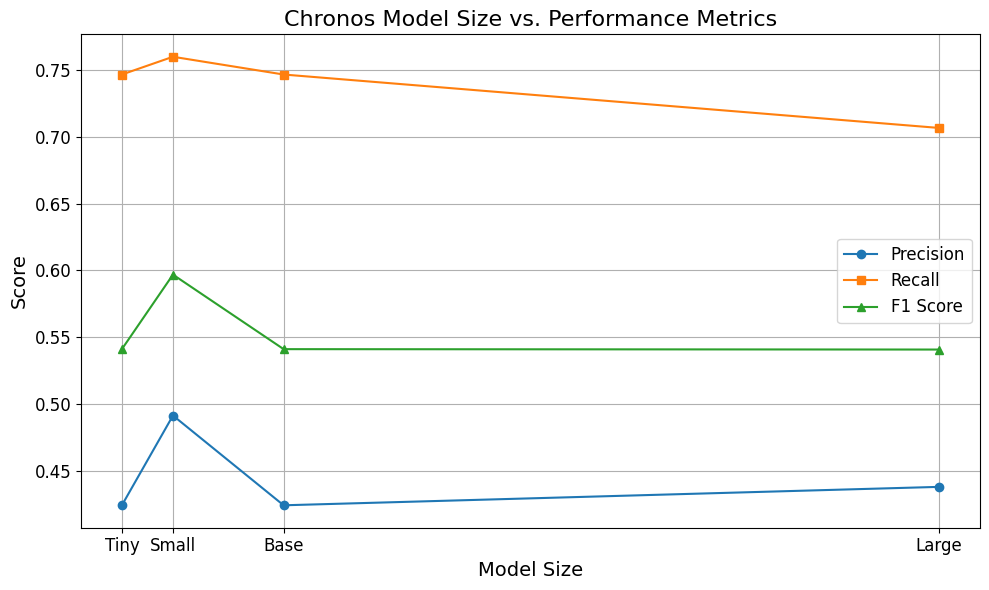

In [ ]:
import matplotlib.pyplot as plt

model_names = ["Tiny", "Small", "Base", "Large"]
params = [8, 20, 46, 200] # model size in millions of parameters

precision = [0.4242, 0.4914, 0.4242, 0.4380]  # these values are copied from the prevous results of the models above. Please refer to them.
recall    = [0.7467, 0.7600, 0.7467, 0.7067]
f1_score  = [0.5411, 0.5969, 0.5411, 0.5408]

plt.figure(figsize=(10, 6))
plt.plot(params, precision, marker='o', label='Precision')
plt.plot(params, recall, marker='s', label='Recall')
plt.plot(params, f1_score, marker='^', label='F1 Score')

plt.title("Chronos Model Size vs. Performance Metrics", fontsize=16)
plt.xlabel("Model Size", fontsize=14)
plt.ylabel("Score", fontsize=14)
plt.xticks(params, model_names, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
from chronos import BaseChronosPipeline
import pandas as pd
import numpy as np
import torch

df = pd.read_csv('./weather.csv')
data = df['airTemperature'].values

pipeline = BaseChronosPipeline.from_pretrained(
    "amazon/chronos-t5-base",
    device_map="cuda",
    torch_dtype=torch.bfloat16,
)

def add_anomalies(data, anomaly_frac=0.15, min_dev_ratio=0.1):
    df = pd.DataFrame({'value': data})
    n = len(df)
    n_anomalies = int(anomaly_frac * n)
    indices = np.random.choice(df.index, size=n_anomalies, replace=False)
    avg_val = df['value'].mean()
    min_deviation = min_dev_ratio * avg_val
    df['m_value'] = df['value']
    df['is_anomaly'] = False
    for idx in indices:
        orig = df.at[idx, 'value']
        dev = max(0.1 * orig, min_deviation)
        new_val = orig + dev if np.random.rand() > 0.5 else orig - dev
        df.at[idx, 'm_value'] = new_val
        df.at[idx, 'is_anomaly'] = True
    return df

def chronos_stepwise_forecast(input_data, context_window=500, forecast_window=500):
    low_preds, med_preds, high_preds = [], [], []
    context = list(input_data[0:context_window])
    for t in range(context_window, forecast_window + context_window):
        context_tensor = torch.tensor(context, dtype=torch.float32)
        quantiles, _ = pipeline.predict_quantiles(
            context=context_tensor,
            prediction_length=1,
            quantile_levels=[0.1, 0.5, 0.9]
        )
        low_preds.append(quantiles[0, 0, 0])
        med_preds.append(quantiles[0, 0, 1])
        high_preds.append(quantiles[0, 0, 2])
        context.append(input_data[t])
        context.pop(0)
    return np.array(low_preds), np.array(med_preds), np.array(high_preds)

def evaluate_detection(low_preds, high_preds, anomaly_data, anomaly_labels):
    anomaly_indices = np.where(anomaly_labels == True)[0]
    non_anomaly_indices = np.where(anomaly_labels == False)[0]
    anomaly_outside = np.logical_or(
        anomaly_data[anomaly_indices] < low_preds[anomaly_indices],
        anomaly_data[anomaly_indices] > high_preds[anomaly_indices]
    )
    non_anomaly_outside = np.logical_or(
        anomaly_data[non_anomaly_indices] < low_preds[non_anomaly_indices],
        anomaly_data[non_anomaly_indices] > high_preds[non_anomaly_indices]
    )
    TP = np.sum(anomaly_outside)
    FN = len(anomaly_indices) - TP
    FP = np.sum(non_anomaly_outside)
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    return precision, recall, f1

results = []
for anomaly_frac in [0.05, 0.10, 0.20]:
    for ratio in [0.05, 0.10, 0.20]:
        data_anom = add_anomalies(data[1500:2000], anomaly_frac=anomaly_frac, min_dev_ratio=ratio)
        all_input = np.concatenate((data[1000:1500], data_anom['m_value'].values))
        low, med, high = chronos_stepwise_forecast(all_input)
        precision, recall, f1 = evaluate_detection(
            low_preds=low,
            high_preds=high,
            anomaly_data=data_anom['m_value'].values,
            anomaly_labels=data_anom['is_anomaly'].values
        )
        results.append({
            "Anomaly Fraction": f"{int(anomaly_frac * 100)}%",
            "Magnitude Threshold": f"{int(ratio * 100)}%",
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1
        })

results_df = pd.DataFrame(results)
print(results_df)


  Anomaly Fraction Magnitude Threshold  Precision  Recall  F1 Score
0               5%                  5%   0.189189    0.84  0.308824
1               5%                 10%   0.188525    0.92  0.312925
2               5%                 20%   0.209091    0.92  0.340741
3              10%                  5%   0.301587    0.76  0.431818
4              10%                 10%   0.302326    0.78  0.435754
5              10%                 20%   0.384000    0.96  0.548571
6              20%                  5%   0.496454    0.70  0.580913
7              20%                 10%   0.490066    0.74  0.589641
8              20%                 20%   0.593333    0.89  0.712000


## ARIMA

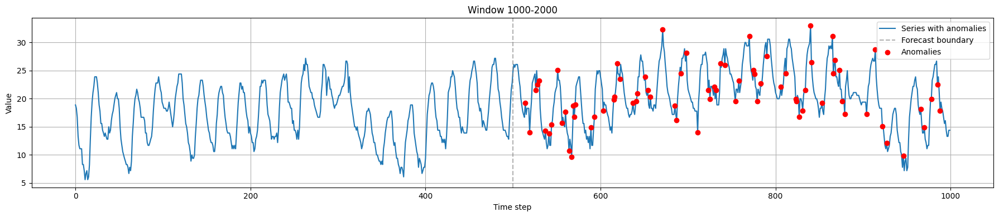

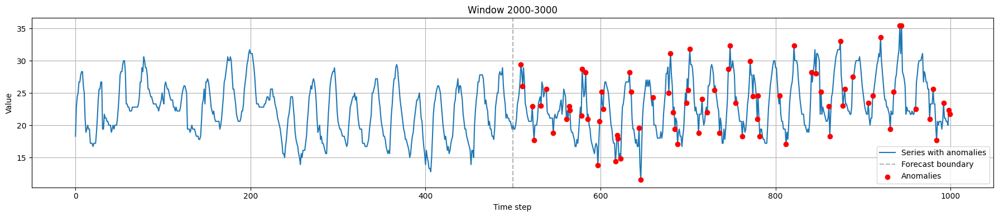

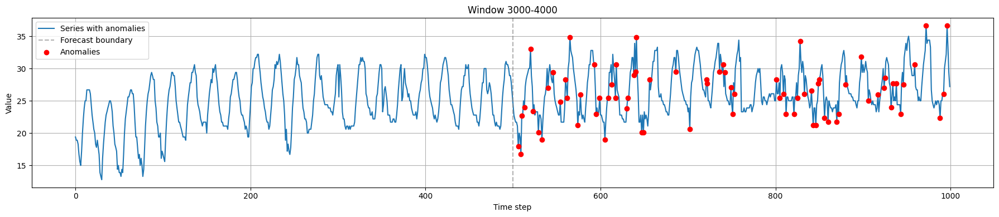

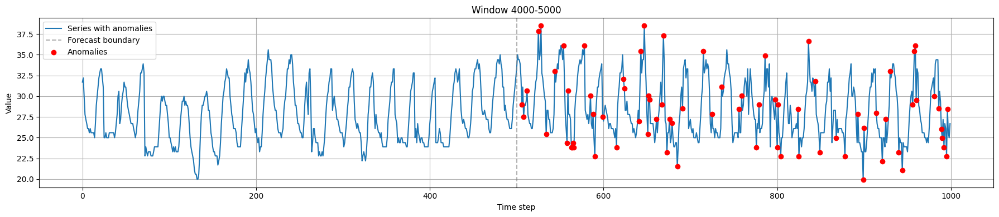

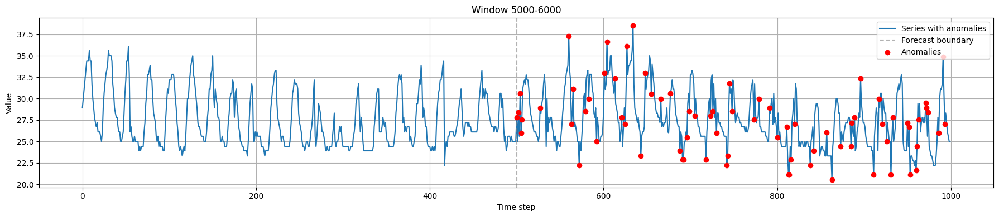

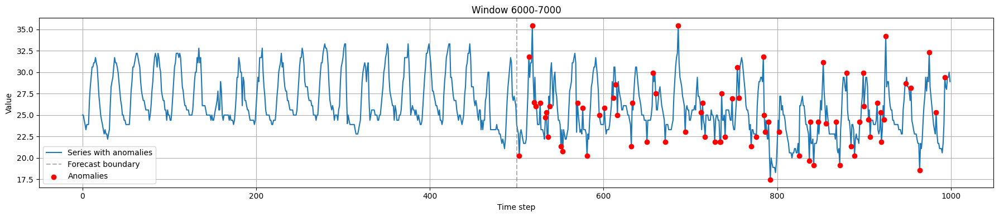

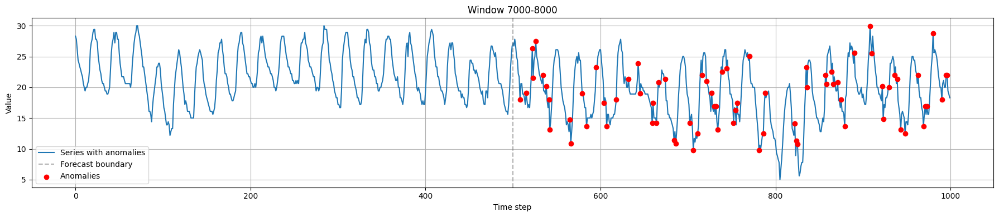

In [55]:

def add_anomalies(data, target_col="Consumption", anomaly_col="m_bool", 
                                 anomaly_frac=0.15, min_dev_ratio=0.1):

    if isinstance(data, (np.ndarray, list)):
        data = pd.DataFrame({target_col: data})
    else:
        data = data.copy()

    n = len(data)
    n_anomalies = int(anomaly_frac * n)
    indices = np.random.choice(data.index, size=n_anomalies, replace=False)

    avg_load = data[target_col].mean()
    min_deviation = min_dev_ratio * avg_load


    data[f"m_{target_col}"] = data[target_col]
    data[anomaly_col] = False


    for idx in indices:
        original = data.at[idx, target_col]
        deviation = max(0.1 * original, min_deviation)

        if np.random.rand() < 0.5:
            new_val = original - deviation
        else:
            new_val = original + deviation
        data.at[idx, f"m_{target_col}"] = new_val
        data.at[idx, anomaly_col] = True

    return data

from copy import deepcopy
all_windows = []     
all_labels = []


for i in range(1000, 8000, 1000):
    context = data[i:i+500]
    forecast = data[i+500:i+1000]

    data_with_anomalies = add_anomalies(
        forecast,
        target_col="Consumption",
        anomaly_col="m_bool",
        anomaly_frac=0.15,
        min_dev_ratio=0.1
    )

    modified_forecast = data_with_anomalies["m_Consumption"].values
    anomaly_labels = data_with_anomalies["m_bool"].values.astype(bool)

    full_series = np.concatenate((context, modified_forecast))

    all_windows.append(full_series)
    all_labels.append(anomaly_labels)

    plt.figure(figsize=(18, 4))
    plt.plot(full_series, label="Series with anomalies")
    plt.axvline(x=500, color="gray", linestyle="--", alpha=0.6, label="Forecast boundary")

    anomaly_indices = np.where(anomaly_labels)[0] + 500
    plt.scatter(anomaly_indices, full_series[anomaly_indices],
                color="red", label="Anomalies", zorder=5)

    plt.title(f"Window {i}-{i+1000}")
    plt.xlabel("Time step")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

def arima_stepwise_forecast(input_data, context_window=500, forecast_window=500):
    low_preds, med_preds, high_preds = [], [], []
    for t in range(forecast_window):
        window_data = input_data[t:t+context_window]
        model = ARIMA(window_data, order=(2, 1, 1)) 
        fit = model.fit()
        forecast = fit.get_forecast(steps=1)
        mean = forecast.predicted_mean[0]
        conf = forecast.conf_int(alpha=0.2)
        
        low = conf[0, 0]
        high = conf[0, 1]
        low_preds.append(low)
        med_preds.append(mean)
        high_preds.append(high)
    return np.array(low_preds), np.array(med_preds), np.array(high_preds)

In [57]:
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

all_low_preds_arima = []
all_med_preds_arima = []
all_high_preds_arima = []

for i, window in enumerate(all_windows):
    print(f"Running ARIMA on window {i + 1}...")
    low_preds, med_preds, high_preds = arima_stepwise_forecast(
            input_data=window,
            context_window=500,
            forecast_window=500
        )
    all_low_preds_arima.append(low_preds)
    all_med_preds_arima.append(med_preds)
    all_high_preds_arima.append(high_preds)

Running ARIMA on window 1...
Running ARIMA on window 2...


c:\Users\navid-pc\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\navid-pc\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\navid-pc\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Running ARIMA on window 3...
Running ARIMA on window 4...
Running ARIMA on window 5...
Running ARIMA on window 6...
Running ARIMA on window 7...


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score

def evaluate_and_plot_window(
    window,              
    anomaly_labels,        
    low_preds,            
    med_preds,            
    high_preds,            
    title="Anomalies Detected vs. Not Detected (Arima)"
):
    anomaly_data = window[500:]  
    anomaly_labels = anomaly_labels.astype(bool)

    low_preds_p = np.array(low_preds)
    high_preds_p = np.array(high_preds)

    anomaly_indices = np.where(anomaly_labels)[0]
    anomaly_data_subset = anomaly_data[anomaly_indices]
    anomaly_low_preds = low_preds_p[anomaly_indices]
    anomaly_high_preds = high_preds_p[anomaly_indices]

    anomaly_outside_preds = np.logical_or(
        anomaly_data_subset < anomaly_low_preds,
        anomaly_data_subset > anomaly_high_preds
    )
    num_anomalies_detected = np.sum(anomaly_outside_preds)
    num_anomalies = len(anomaly_indices)

    non_anomaly_indices = np.where(anomaly_labels == False)[0]
    non_anomaly_data_subset = anomaly_data[non_anomaly_indices]
    non_anomaly_low_preds = low_preds_p[non_anomaly_indices]
    non_anomaly_high_preds = high_preds_p[non_anomaly_indices]

    non_anomaly_outside_preds = np.logical_or(
        non_anomaly_data_subset < non_anomaly_low_preds,
        non_anomaly_data_subset > non_anomaly_high_preds
    )
    num_false_positives = np.sum(non_anomaly_outside_preds)
    num_non_anomalies = len(non_anomaly_indices)

    TP = num_anomalies_detected
    FP = num_false_positives
    FN = num_anomalies - TP
    TN = num_non_anomalies - FP

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

    print("\nConfusion Matrix:")
    print(f"TP: {TP}, FP: {FP}, FN: {FN}, TN: {TN}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

    detected_indices = anomaly_indices[anomaly_outside_preds]
    missed_indices = anomaly_indices[~anomaly_outside_preds]
    detected_values = anomaly_data_subset[anomaly_outside_preds]
    missed_values = anomaly_data_subset[~anomaly_outside_preds]

    plt.figure(figsize=(30, 8))
    plt.plot(window, color="green", label="All data")
    plt.plot(range(500, 1000), med_preds, color="red", label="Median forecast")
    plt.fill_between(range(500, 1000), low_preds, high_preds, color="tomato", alpha=0.3, label="80% PI")
    plt.scatter(detected_indices + 500, detected_values, color="blue", label="Detected Anomalies")
    plt.scatter(missed_indices + 500, missed_values, color="orange", label="Missed Anomalies")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(window[800:], color="green", label="Ground truth")
    plt.plot(range(0, 200), med_preds[300:], color="red", label="Median forecast")
    plt.fill_between(range(0, 200), low_preds[300:], high_preds[300:], color="tomato", alpha=0.3, label="80% PI")
    plt.scatter(detected_indices[detected_indices > 300] - 300, detected_values[detected_indices > 300],
                color="blue", label="Detected")
    plt.scatter(missed_indices[missed_indices > 300] - 300, missed_values[missed_indices > 300],
                color="orange", label="Missed")
    plt.title(f"{title} (Zoomed In)")
    plt.xlabel("Time Step")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    return TP, FP, FN, TN, precision, recall, f1



Confusion Matrix:
TP: 44, FP: 80, FN: 31, TN: 345
Precision: 0.3548, Recall: 0.5867, F1 Score: 0.4422


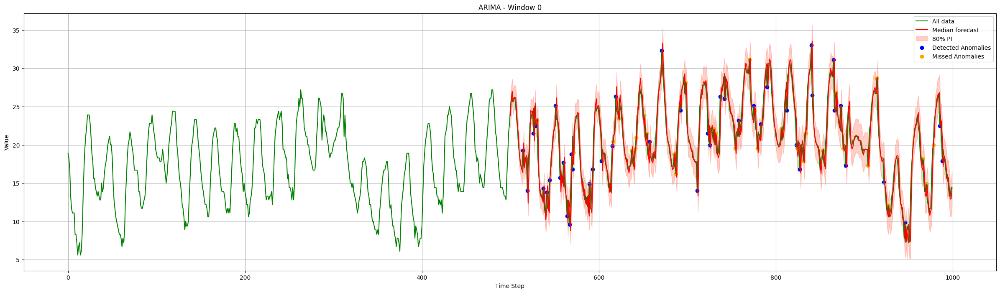

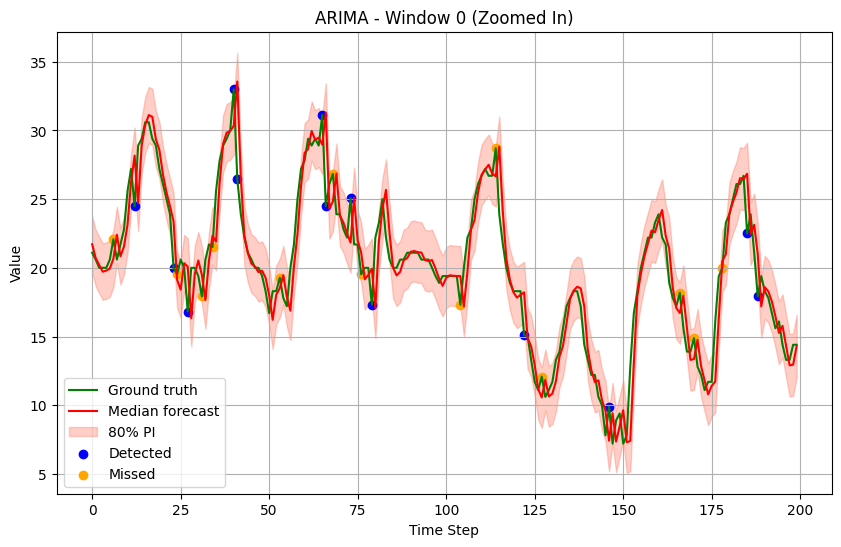

(44, 80, 31, 345, 0.3548387096774194, 0.5866666666666667, 0.44221105527638194)

In [59]:
evaluate_and_plot_window(
    window=all_windows[0],
    anomaly_labels=all_labels[0],
    low_preds=all_low_preds_arima[0],
    med_preds=all_med_preds_arima[0],
    high_preds=all_high_preds_arima[0],
    title=f"ARIMA - Window {0}"
)

In [ ]:
total_TP = total_FP = total_FN = total_TN = 0

for i in range(len(all_windows)):
    window = all_windows[i]
    labels = all_labels[i]
    low_preds = all_low_preds_arima[i]
    high_preds = all_high_preds_arima[i]

    if np.any(np.isnan(low_preds)) or np.any(np.isnan(high_preds)):
        print(f"Skipping window {i} due to invalid ARIMA forecast.")
        continue

    true_vals = window[500:]  

    anomaly_indices = np.where(labels == True)[0]
    non_anomaly_indices = np.where(labels == False)[0]

    anomaly_vals = true_vals[anomaly_indices]
    anomaly_low = low_preds[anomaly_indices]
    anomaly_high = high_preds[anomaly_indices]

    detected_anomalies = np.logical_or(
        anomaly_vals < anomaly_low,
        anomaly_vals > anomaly_high
    )
    TP = np.sum(detected_anomalies)
    FN = len(anomaly_indices) - TP

    non_anomaly_vals = true_vals[non_anomaly_indices]
    non_anomaly_low = low_preds[non_anomaly_indices]
    non_anomaly_high = high_preds[non_anomaly_indices]

    false_positives = np.logical_or(
        non_anomaly_vals < non_anomaly_low,
        non_anomaly_vals > non_anomaly_high
    )
    FP = np.sum(false_positives)
    TN = len(non_anomaly_indices) - FP

    total_TP += TP
    total_FP += FP
    total_FN += FN
    total_TN += TN

precision = total_TP / (total_TP + total_FP) if (total_TP + total_FP) > 0 else 0
recall = total_TP / (total_TP + total_FN) if (total_TP + total_FN) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {total_TP}")
print(f"False Positives (FP): {total_FP}")
print(f"False Negatives (FN): {total_FN}")
print(f"True Negatives (TN): {total_TN}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")


True Positives (TP): 357
False Positives (FP): 570
False Negatives (FN): 168
True Negatives (TN): 2405
Precision: 0.3851
Recall:    0.6800
F1 Score:  0.4917
